In [100]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [101]:
def imshow(title="", image=None, size=10):
    h, w = image.shape[0], image.shape[1]
    aspect_ratio = w / h

    plt.figure(figsize=(size * aspect_ratio, size))

    # Check if the image is grayscale
    if len(image.shape) == 2:  # Grayscale images have only 2 dimensions
        plt.imshow(image, cmap="gray")  # Use the 'gray' colormap for grayscale images
    else:
        plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))  # Convert color images to RGB

    plt.title(title)
    plt.axis('off')  # Optional: Remove axis
    plt.show()

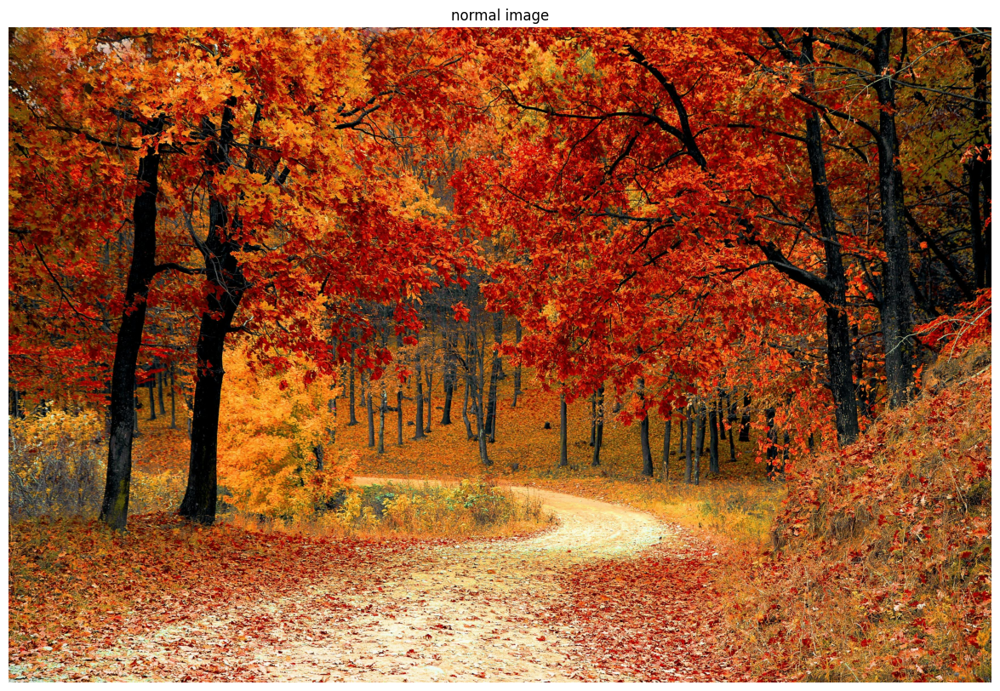

In [125]:
image_path='/content/drive/MyDrive/MyDataSet/Class1/nature1.jpg'

image=cv.imread(image_path)
imshow("normal image",image)


In [126]:
# TASK 13 LINE , CIRCLE AND BLOB DETECTION

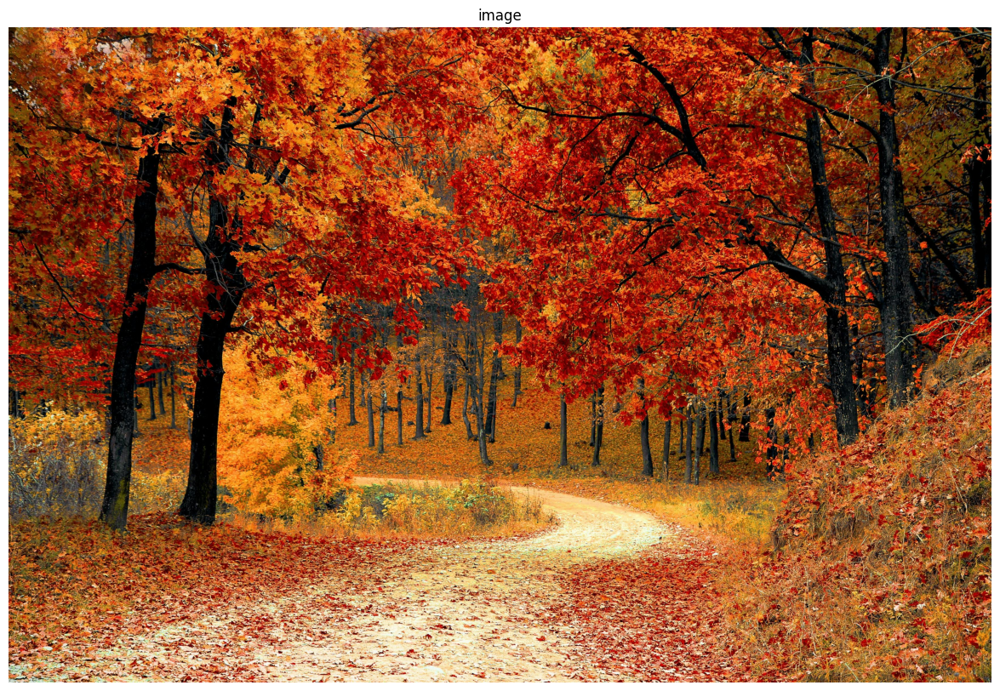

In [127]:
imshow("image",image)

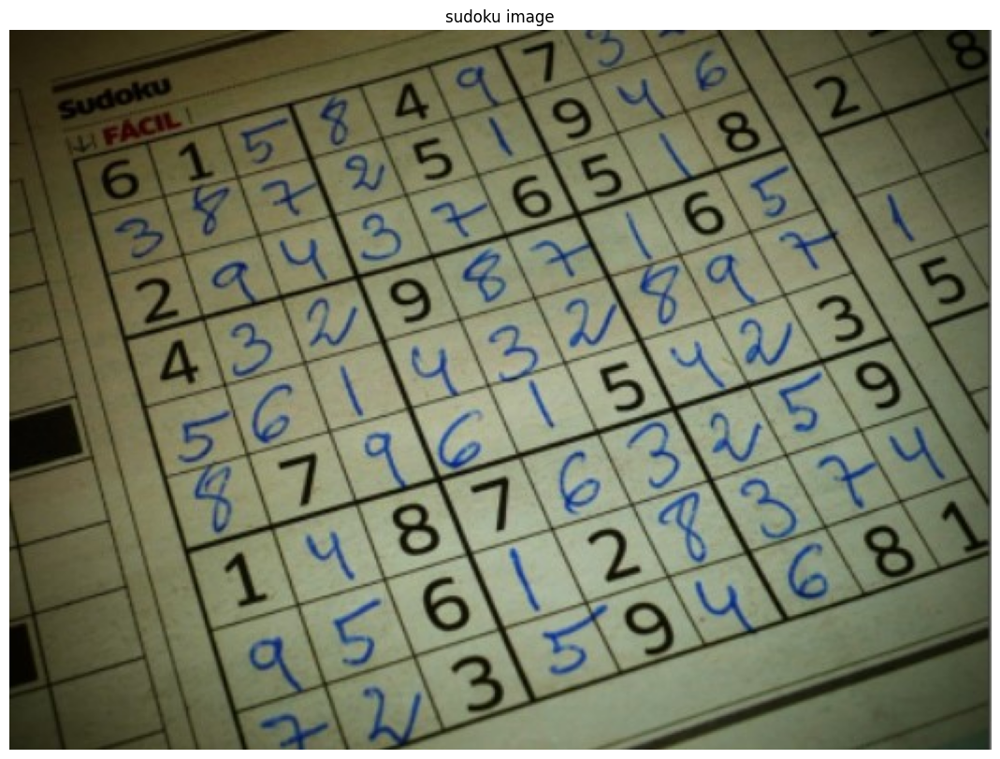

In [128]:
image_path='/content/drive/MyDrive/MyDataSet/SCLASS/sudoku.jpg'

image=cv.imread(image_path)
imshow("sudoku image",image,size=10)

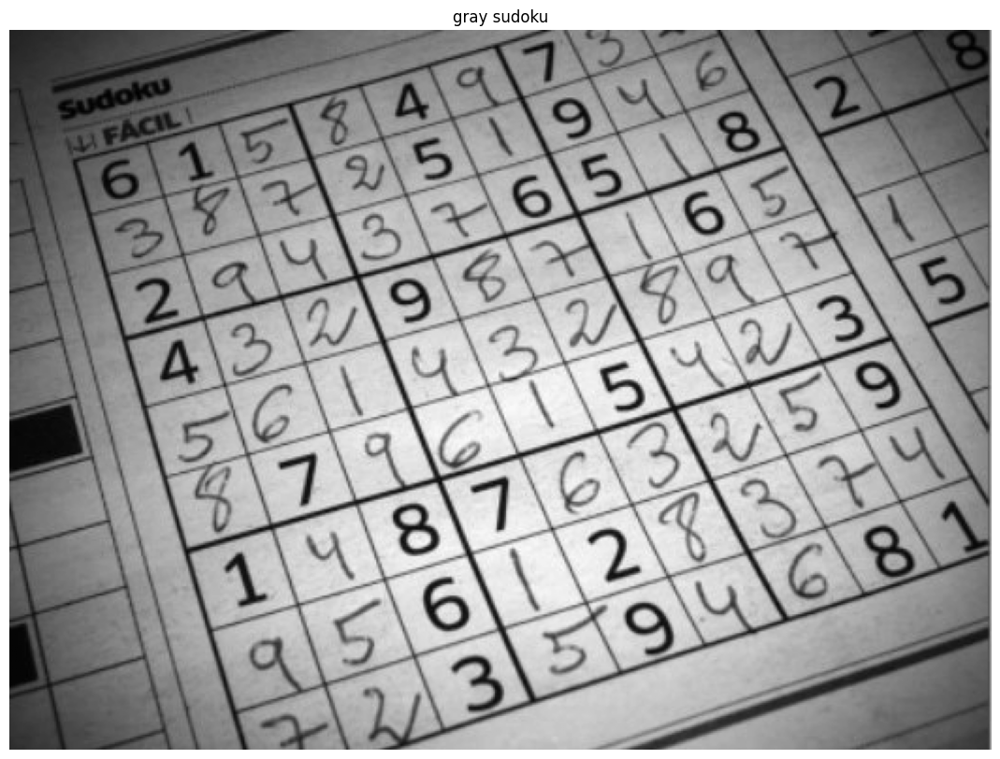

In [130]:
# convert the image to grayscale

gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
imshow("gray sudoku",gray)

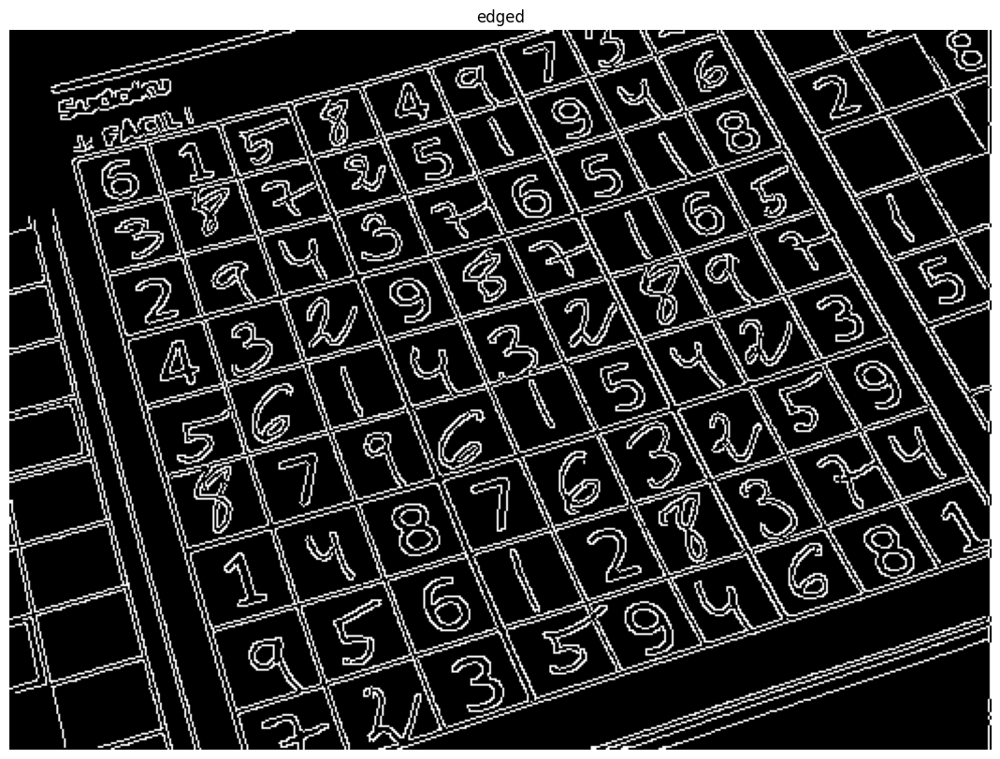

In [131]:
edged=cv.Canny(gray,100,170,apertureSize=3)
imshow("edged",edged)

3


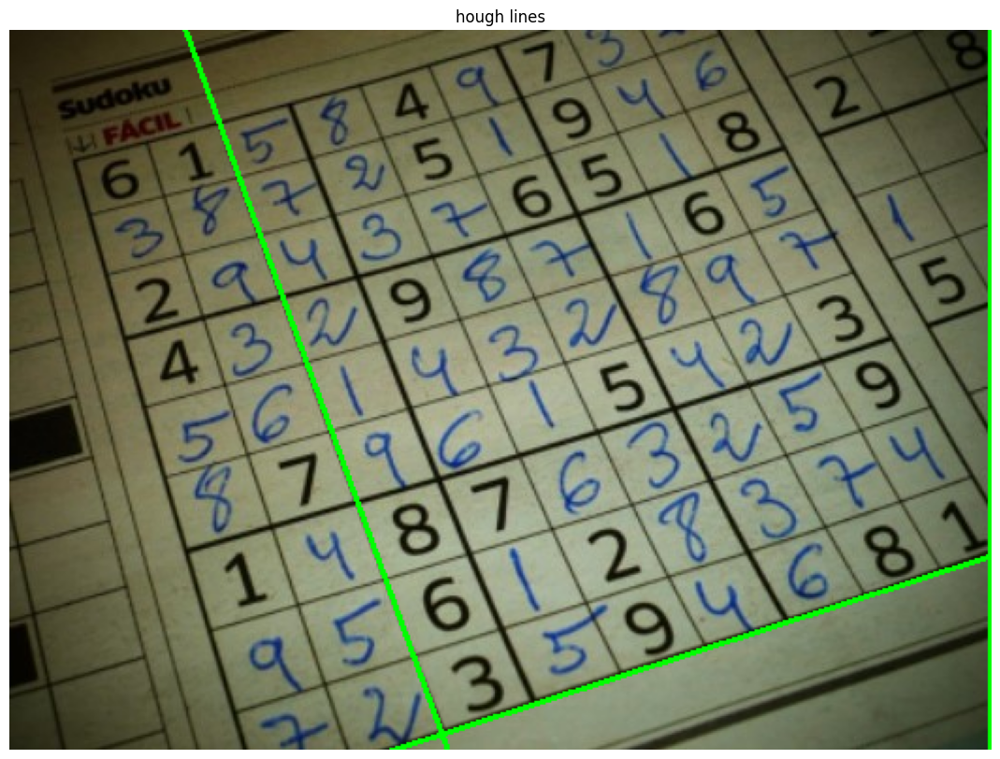

In [132]:
# Run HoughLines using a rho accuracy of 1 pixel
# theta accuracy of np.pi / 180 which is 1 degree
# Our line threshold is set to 240 (number of points on line)

lines=cv.HoughLines(edged,1,np.pi/180,240)

image_copy=image.copy()
# We iterate through each line and convert it to the format
# required by cv2.lines (i.e. requiring end points)
print(len(lines))
for line in lines:
  rho,theta=line[0]
  a=np.cos(theta)
  b=np.sin(theta)
  x0=a*rho
  y0=b*rho
  x1 = int(x0 + 1000 * (-b))
  y1 = int(y0 + 1000 * (a))
  x2 = int(x0 - 1000 * (-b))
  y2 = int(y0 - 1000 * (a))
  cv.line(image,(x1,y1),(x2,y2),(0,255,0),2)

imshow("hough lines",image)

In [133]:
# Probabilistic Hough Lines
# A Hough Transform is considered probabilistic if it uses random sampling of the edge points. These algorithms can be divided based on how they map image space to parameter space.

(38, 1, 4)


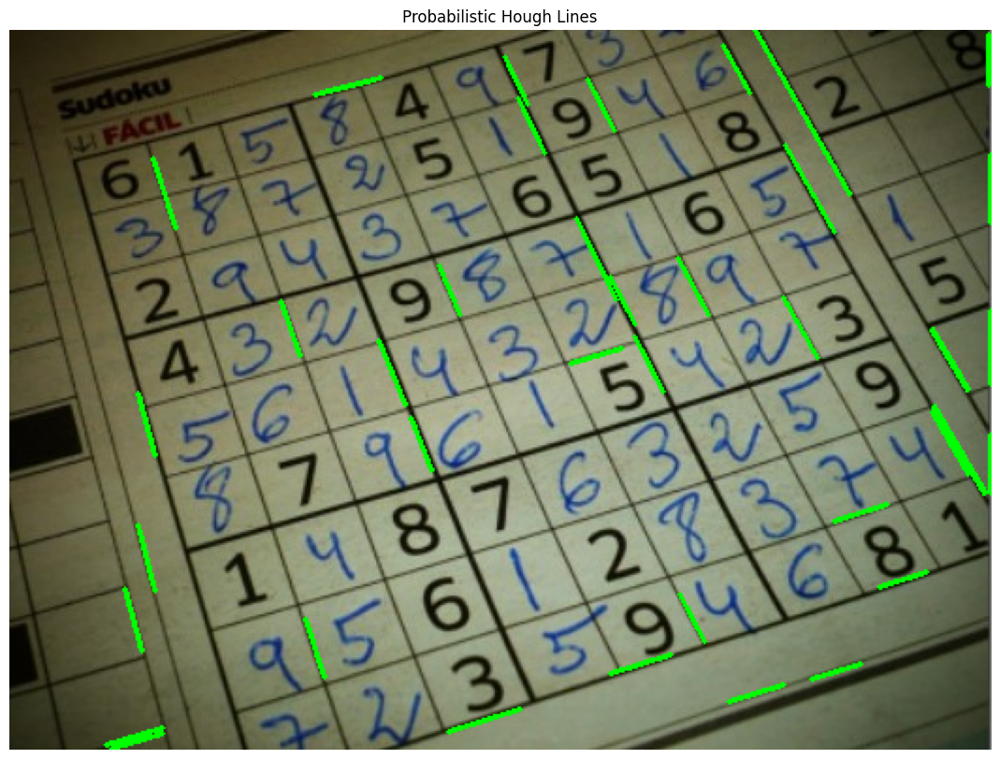

In [134]:
image_path='/content/drive/MyDrive/MyDataSet/SCLASS/sudoku.jpg'
image=cv.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)

# Again we use the same rho and theta accuracies
# However, we specific a minimum vote (pts along line) of 100
# and Min line length of 3 pixels and max gap between lines of 25 pixels

lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 100, 3, 25)
print(lines.shape)

for x in range(0, len(lines)):
    for x1,y1,x2,y2 in lines[x]:
        cv2.line(image,(x1,y1),(x2,y2),(0,255,0),2)

imshow('Probabilistic Hough Lines', image)

In [135]:
# CIRCLE DETECTION

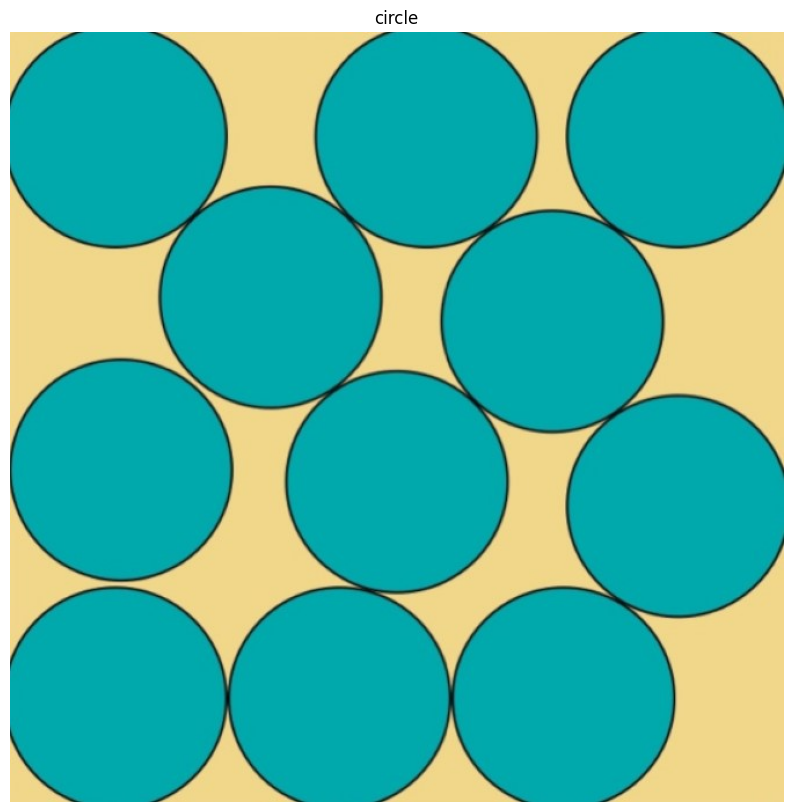

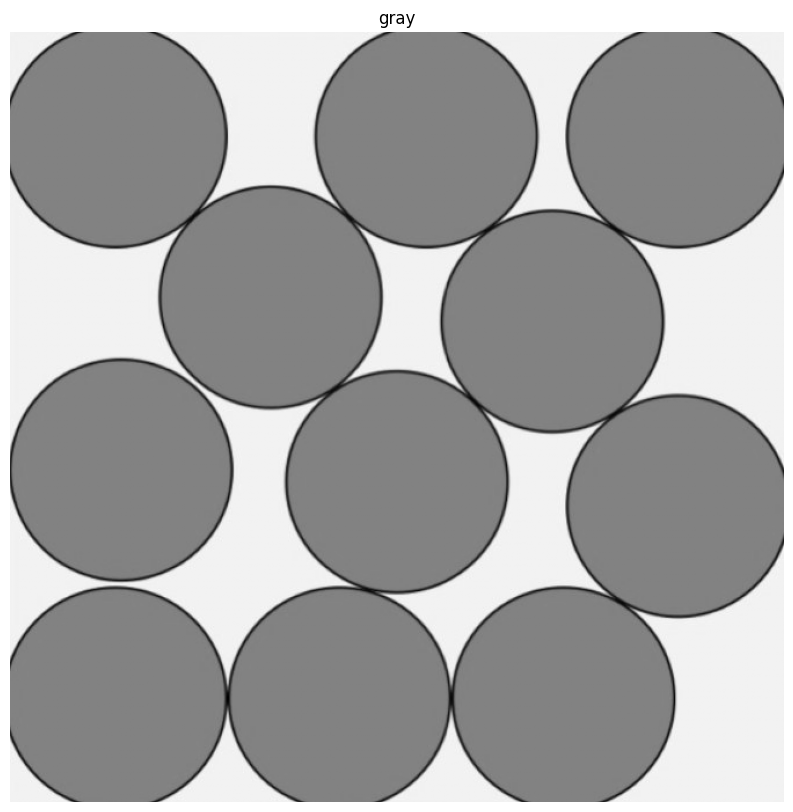

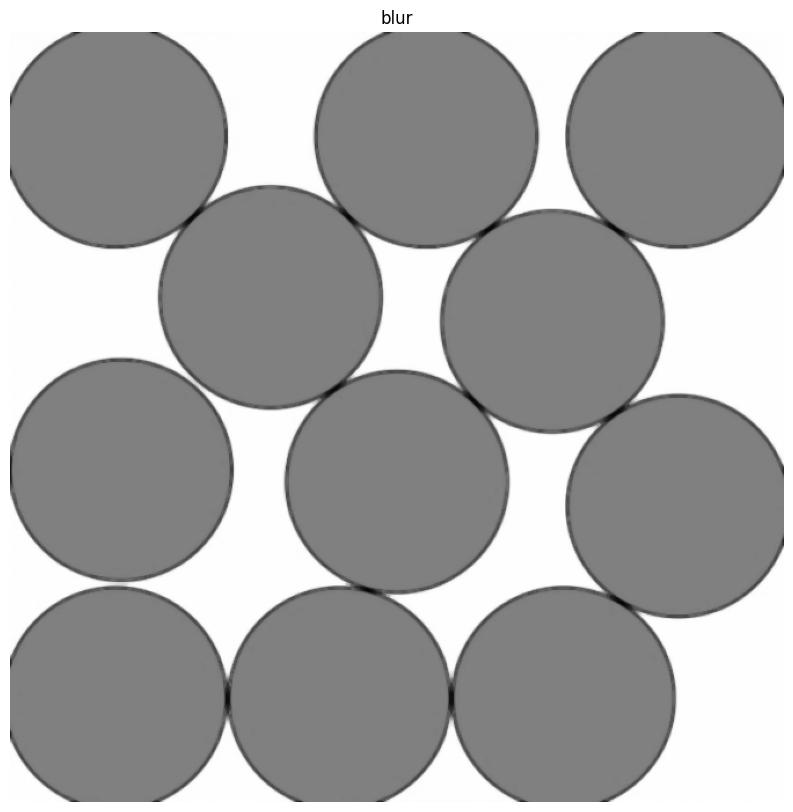

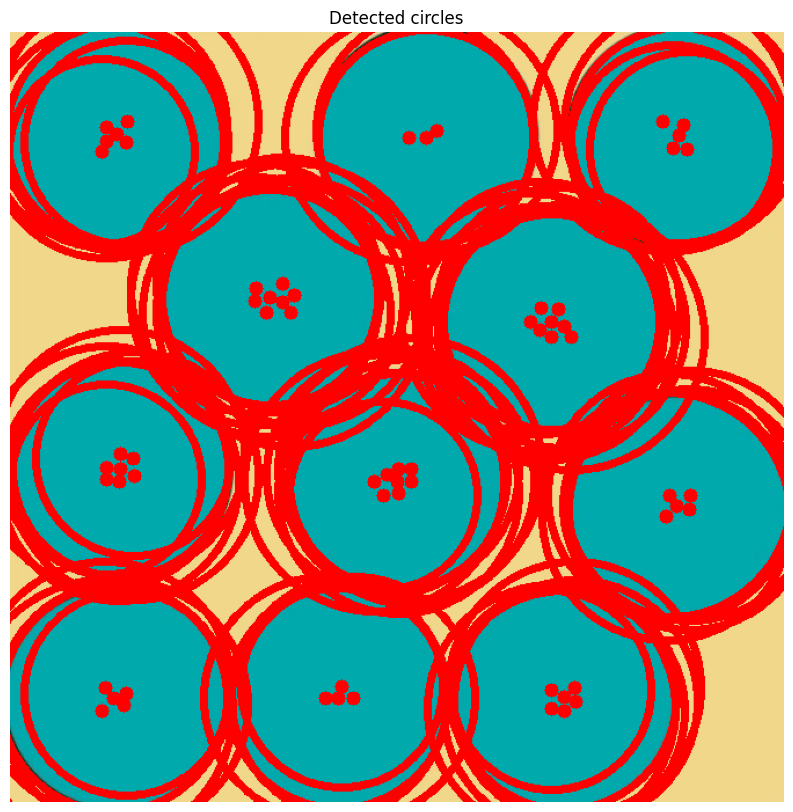

In [136]:
image_path='/content/drive/MyDrive/MyDataSet/SCLASS/circles.jpg'
image=cv.imread(image_path)
imshow("circle",image)

gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
imshow("gray",gray)

blur=cv.medianBlur(gray,5)
imshow("blur",blur)

circles=cv.HoughCircles(blur,cv.HOUGH_GRADIENT,1.5,10)

circles = np.uint16(np.around(circles))


for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(image,(i[0], i[1]), i[2], (0, 0, 255), 5)

    # draw the center of the circle
    cv2.circle(image, (i[0], i[1]), 2, (0, 0, 255), 8)


imshow('Detected circles', image)

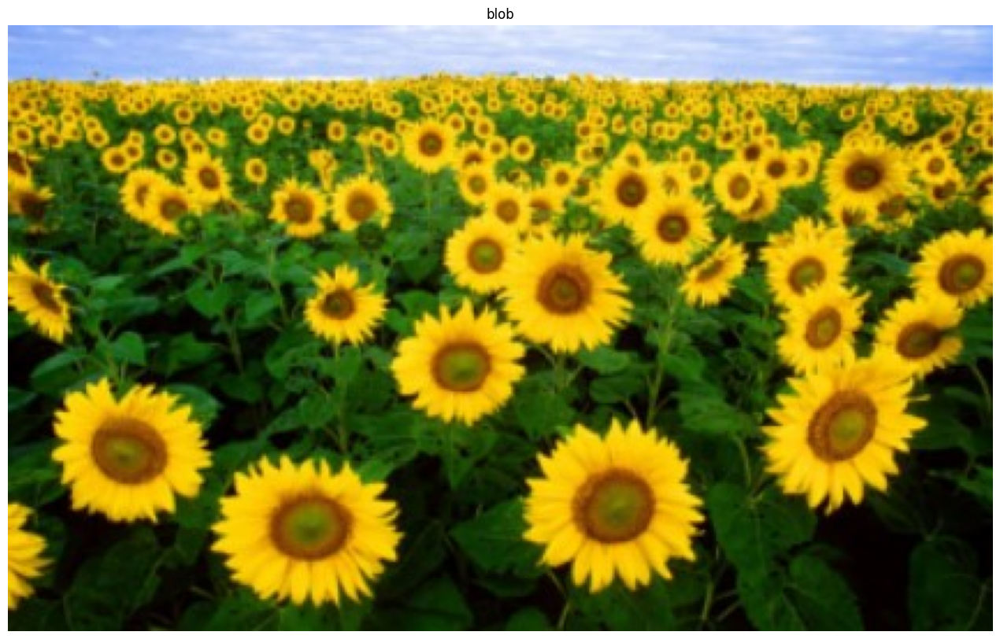

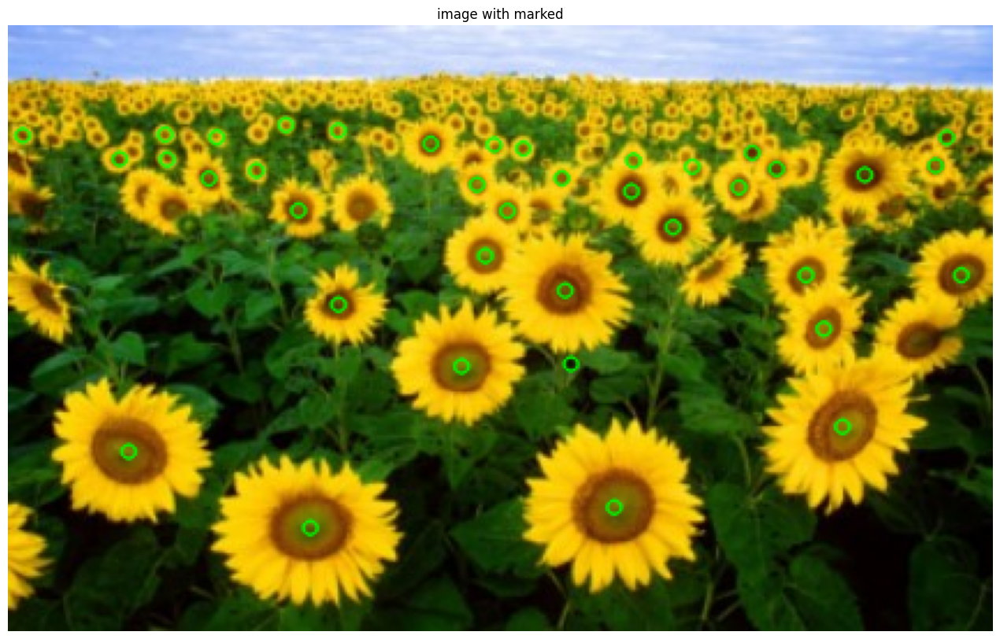

In [137]:
image_path='/content/drive/MyDrive/MyDataSet/SCLASS/flower.jpg'
image=cv.imread(image_path)
imshow("blob",image)

# Set up the detector with default parameters.
detector = cv2.SimpleBlobDetector_create()

# Detect blobs.
keypoints = detector.detect(image)

blank = np.zeros((1,1))
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DEFAULT)

imshow("image with marked",blobs)